In [145]:
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import roc_curve,roc_auc_score
import matplotlib.pyplot as plt
from sklearn.metrics import log_loss
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from sklearn.model_selection import StratifiedKFold, cross_val_score ,KFold
from sklearn.model_selection import GridSearchCV
import numpy as np
from sklearn.pipeline import Pipeline
from sklearn.naive_bayes import GaussianNB
from sklearn.preprocessing import LabelEncoder 
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
import pandas as pd
import numpy as np
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier ,DecisionTreeRegressor


In [2]:
import os
os.chdir(r'C:\Users\dbda-lab\Desktop\pml\11 Practical Machine Learning\Datasets')
import pandas as pd

In [3]:
ibm=pd.read_csv('WA_Fn-UseC_-HR-Employee-Attrition.csv')

In [4]:
ibm

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,...,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,...,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,...,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,...,4,80,0,17,3,2,9,6,0,8


In [6]:
dum_ibm=pd.get_dummies(ibm,drop_first=True)

In [8]:
dum_ibm

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,...,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Married,MaritalStatus_Single,OverTime_Yes
0,41,1102,1,2,1,1,2,94,3,2,...,0,0,0,0,0,1,0,0,1,1
1,49,279,8,1,1,2,3,61,2,2,...,0,0,0,0,1,0,0,1,0,0
2,37,1373,2,2,1,4,4,92,2,1,...,1,0,0,0,0,0,0,0,1,1
3,33,1392,3,4,1,5,4,56,3,1,...,0,0,0,0,1,0,0,1,0,1
4,27,591,2,1,1,7,1,40,3,1,...,1,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,884,23,2,1,2061,3,41,4,2,...,1,0,0,0,0,0,0,1,0,0
1466,39,613,6,1,1,2062,4,42,2,3,...,0,0,0,0,0,0,0,1,0,0
1467,27,155,4,3,1,2064,2,87,4,2,...,0,0,1,0,0,0,0,1,0,1
1468,49,1023,2,3,1,2065,4,63,2,2,...,0,0,0,0,0,1,0,1,0,0


In [ ]:
# probability /majority of No is High is tree stopped here 

In [17]:
X_test

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,...,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Married,MaritalStatus_Single,OverTime_Yes
693,36,530,3,1,1,967,3,51,2,3,...,0,0,0,0,0,1,0,1,0,1
1054,49,1490,7,4,1,1484,3,35,3,3,...,0,0,0,0,0,0,0,0,0,0
1023,56,1255,1,2,1,1441,1,90,3,1,...,0,0,0,0,1,0,0,1,0,0
670,27,618,4,3,1,933,2,76,3,1,...,0,0,0,0,1,0,0,0,1,0
618,25,180,2,1,1,854,1,65,4,1,...,0,0,0,0,1,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
945,50,1322,28,3,1,1317,4,43,3,4,...,0,0,0,1,0,0,0,1,0,1
582,40,791,2,2,1,807,3,38,4,2,...,0,0,0,0,0,0,0,1,0,0
579,34,121,2,4,1,804,3,86,2,1,...,0,0,0,0,1,0,0,0,1,0
94,32,1093,6,4,1,125,2,87,3,2,...,0,0,0,0,0,1,0,0,1,0


[Text(0.5, 0.875, 'OverTime_Yes <= 0.5\ngini = 0.271\nsamples = 1029\nvalue = [863, 166]\nclass = No'),
 Text(0.25, 0.625, 'YearsAtCompany <= 1.5\ngini = 0.186\nsamples = 740\nvalue = [663, 77]\nclass = No'),
 Text(0.125, 0.375, 'Age <= 32.5\ngini = 0.375\nsamples = 96\nvalue = [72, 24]\nclass = No'),
 Text(0.0625, 0.125, 'gini = 0.476\nsamples = 46\nvalue = [28, 18]\nclass = No'),
 Text(0.1875, 0.125, 'gini = 0.211\nsamples = 50\nvalue = [44, 6]\nclass = No'),
 Text(0.375, 0.375, 'JobSatisfaction <= 1.5\ngini = 0.151\nsamples = 644\nvalue = [591, 53]\nclass = No'),
 Text(0.3125, 0.125, 'gini = 0.26\nsamples = 130\nvalue = [110, 20]\nclass = No'),
 Text(0.4375, 0.125, 'gini = 0.12\nsamples = 514\nvalue = [481, 33]\nclass = No'),
 Text(0.75, 0.625, 'JobLevel <= 1.5\ngini = 0.426\nsamples = 289\nvalue = [200, 89]\nclass = No'),
 Text(0.625, 0.375, 'MonthlyIncome <= 2469.5\ngini = 0.498\nsamples = 105\nvalue = [49, 56]\nclass = Yes'),
 Text(0.5625, 0.125, 'gini = 0.381\nsamples = 43\nvalu

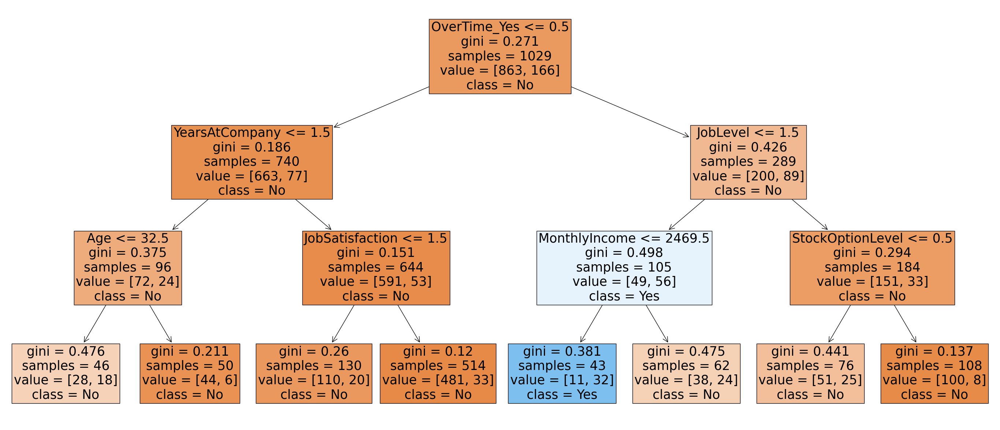

In [23]:
ibm = pd.read_csv('WA_Fn-UseC_-HR-Employee-Attrition.csv')
dum_ibm =pd.get_dummies(ibm,drop_first=True)
x = dum_ibm.drop('Attrition_Yes',axis =1)
y = dum_ibm['Attrition_Yes']

X_train,X_test,y_train,y_test = train_test_split(x,y,stratify=y,random_state=2023,test_size=0.3)

dtc = DecisionTreeClassifier(random_state=2023,max_depth=3)

dtc.fit(X_train,y_train)

plt.figure(figsize=(35,15))
tree.plot_tree(dtc,feature_names=X_train.columns,
               class_names=['No','Yes'],
               filled=True, fontsize=25)

In [ ]:
# probability /majority of No is High is tree stopped here 

In [29]:
y_pred=dtc.predict(X_test)
y_pred

array([0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0,

### Using Kfold  and GridSearch

In [37]:
kfold=StratifiedKFold(n_splits=5,shuffle=True,random_state=2023)

dtc= DecisionTreeClassifier(random_state=2023)

params={'max_depth':[None,3,4,5],
       'min_samples_split':[2,5,10],    #dont make mistake in sample and samples correct : samples
       'min_samples_leaf':[1,4,10]}

gcv=GridSearchCV(dtc,param_grid=params,scoring='roc_auc',cv=kfold)

gcv.fit(x,y)

print(gcv.best_params_)
print(gcv.best_score_)
print('# now we get best model')

{'max_depth': 4, 'min_samples_leaf': 4, 'min_samples_split': 2}
0.718511058347404
# now we get best model


### max_depthint, default=None
The maximum depth of the tree. If None, then nodes are expanded until all leaves are pure or until all leaves contain less than min_samples_split samples.

### min_samples_splitint or float, default=2
The minimum number of samples required to split an internal node:
If int, then consider min_samples_split as the minimum number.
If float, then min_samples_split is a fraction and ceil(min_samples_split * n_samples) are the minimum number of samples for each split.

### min_samples_leafint or float, default=1
The minimum number of samples required to be at a leaf node. A split point at any depth will only be considered if it leaves at least min_samples_leaf training samples in each of the left and right branches. This may have the effect of smoothing the model, especially in regression.

[Text(0.5, 0.9, 'OverTime_Yes <= 0.5\ngini = 0.27\nsamples = 1470\nvalue = [1233, 237]\nclass = No'),
 Text(0.25, 0.7, 'TotalWorkingYears <= 2.5\ngini = 0.187\nsamples = 1054\nvalue = [944, 110]\nclass = No'),
 Text(0.125, 0.5, 'JobRole_Research Scientist <= 0.5\ngini = 0.442\nsamples = 88\nvalue = [59, 29]\nclass = No'),
 Text(0.0625, 0.3, 'HourlyRate <= 58.5\ngini = 0.495\nsamples = 60\nvalue = [33, 27]\nclass = No'),
 Text(0.03125, 0.1, 'gini = 0.435\nsamples = 25\nvalue = [8, 17]\nclass = Yes'),
 Text(0.09375, 0.1, 'gini = 0.408\nsamples = 35\nvalue = [25, 10]\nclass = No'),
 Text(0.1875, 0.3, 'DistanceFromHome <= 7.5\ngini = 0.133\nsamples = 28\nvalue = [26, 2]\nclass = No'),
 Text(0.15625, 0.1, 'gini = 0.0\nsamples = 18\nvalue = [18, 0]\nclass = No'),
 Text(0.21875, 0.1, 'gini = 0.32\nsamples = 10\nvalue = [8, 2]\nclass = No'),
 Text(0.375, 0.5, 'WorkLifeBalance <= 1.5\ngini = 0.154\nsamples = 966\nvalue = [885, 81]\nclass = No'),
 Text(0.3125, 0.3, 'YearsWithCurrManager <= 0.5\n

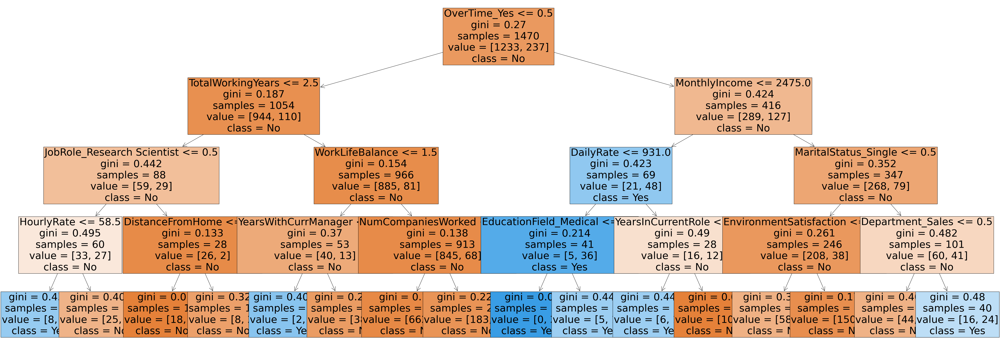

In [43]:
best_model = gcv.best_estimator_
plt.figure(figsize=(70,25))
tree.plot_tree(best_model,feature_names=x.columns,class_names=['No','Yes'],filled=True,fontsize=40)

## For MultiClass Tree

In [47]:
pix=pd.read_csv('Image_Segmention.csv')
pix

,Class,region.centroid.col,region.centroid.row,region.pixel.count,short.line.density.5,short.line.density.2,vedge.mean,vegde.sd,hedge.mean,hedge.sd,intensity.mean,rawred.mean,rawblue.mean,rawgreen.mean,exred.mean,exblue.mean,exgreen.mean,value.mean,saturation.mean,hue-mean
0,BRICKFACE,188,133,9,0.000000,0.0,0.333333,0.266667,0.500000,0.077778,6.666666,8.333334,7.777778,3.888889,5.000000,3.333333,-8.333333,8.444445,0.538580,-0.924817
1,BRICKFACE,105,139,9,0.000000,0.0,0.277778,0.107407,0.833333,0.522222,6.111111,7.555555,7.222222,3.555556,4.333334,3.333333,-7.666666,7.555555,0.532628,-0.965946
2,BRICKFACE,34,137,9,0.000000,0.0,0.500000,0.166667,1.111111,0.474074,5.851852,7.777778,6.444445,3.333333,5.777778,1.777778,-7.555555,7.777778,0.573633,-0.744272
3,BRICKFACE,39,111,9,0.000000,0.0,0.722222,0.374074,0.888889,0.429629,6.037037,7.000000,7.666666,3.444444,2.888889,4.888889,-7.777778,7.888889,0.562919,-1.175773
4,BRICKFACE,16,128,9,0.000000,0.0,0.500000,0.077778,0.666667,0.311111,5.555555,6.888889,6.666666,3.111111,4.000000,3.333333,-7.333334,7.111111,0.561508,-0.985811
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
204,GRASS,36,243,9,0.111111,0.0,1.888889,1.851851,2.000000,0.711110,13.333333,9.888889,12.111111,18.000000,-10.333333,-3.666667,14.000000,18.000000,0.452229,2.368311
205,GRASS,186,218,9,0.000000,0.0,1.166667,0.744444,1.166667,0.655555,13.703704,10.666667,12.666667,17.777779,-9.111111,-3.111111,12.222222,17.777779,0.401347,2.382684
206,GRASS,197,236,9,0.000000,0.0,2.444444,6.829628,3.333333,7.599998,16.074074,13.111111,16.666668,18.444445,-8.888889,1.777778,7.111111,18.555555,0.292729,2.789800
207,GRASS,208,240,9,0.111111,0.0,1.055556,0.862963,2.444444,5.007407,14.148149,10.888889,13.000000,18.555555,-9.777778,-3.444444,13.222222,18.555555,0.421621,2.392487


In [48]:
X = pix.drop('Class', axis=1)
y = pix['Class']
X

,region.centroid.col,region.centroid.row,region.pixel.count,short.line.density.5,short.line.density.2,vedge.mean,vegde.sd,hedge.mean,hedge.sd,intensity.mean,rawred.mean,rawblue.mean,rawgreen.mean,exred.mean,exblue.mean,exgreen.mean,value.mean,saturation.mean,hue-mean
0,188,133,9,0.000000,0.0,0.333333,0.266667,0.500000,0.077778,6.666666,8.333334,7.777778,3.888889,5.000000,3.333333,-8.333333,8.444445,0.538580,-0.924817
1,105,139,9,0.000000,0.0,0.277778,0.107407,0.833333,0.522222,6.111111,7.555555,7.222222,3.555556,4.333334,3.333333,-7.666666,7.555555,0.532628,-0.965946
2,34,137,9,0.000000,0.0,0.500000,0.166667,1.111111,0.474074,5.851852,7.777778,6.444445,3.333333,5.777778,1.777778,-7.555555,7.777778,0.573633,-0.744272
3,39,111,9,0.000000,0.0,0.722222,0.374074,0.888889,0.429629,6.037037,7.000000,7.666666,3.444444,2.888889,4.888889,-7.777778,7.888889,0.562919,-1.175773
4,16,128,9,0.000000,0.0,0.500000,0.077778,0.666667,0.311111,5.555555,6.888889,6.666666,3.111111,4.000000,3.333333,-7.333334,7.111111,0.561508,-0.985811
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
204,36,243,9,0.111111,0.0,1.888889,1.851851,2.000000,0.711110,13.333333,9.888889,12.111111,18.000000,-10.333333,-3.666667,14.000000,18.000000,0.452229,2.368311
205,186,218,9,0.000000,0.0,1.166667,0.744444,1.166667,0.655555,13.703704,10.666667,12.666667,17.777779,-9.111111,-3.111111,12.222222,17.777779,0.401347,2.382684
206,197,236,9,0.000000,0.0,2.444444,6.829628,3.333333,7.599998,16.074074,13.111111,16.666668,18.444445,-8.888889,1.777778,7.111111,18.555555,0.292729,2.789800
207,208,240,9,0.111111,0.0,1.055556,0.862963,2.444444,5.007407,14.148149,10.888889,13.000000,18.555555,-9.777778,-3.444444,13.222222,18.555555,0.421621,2.392487


In [56]:
from sklearn.preprocessing import LabelEncoder
label=LabelEncoder()
le_y=label.fit_transform(y)
le_y

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6,
       6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3])

{'max_depth': 3, 'min_samples_leaf': 1, 'min_samples_split': 2}
-1.4562382696633307


[Text(0.6666666666666666, 0.875, 'JobSatisfaction <= 67.0\ngini = 0.857\nsamples = 209\nvalue = [29, 30, 30, 30, 30, 30, 30]\nclass = CEMENT'),
 Text(0.5, 0.625, 'PerformanceRating <= 0.889\ngini = 0.833\nsamples = 179\nvalue = [29, 30, 30, 30, 30, 0, 30]\nclass = CEMENT'),
 Text(0.3333333333333333, 0.375, 'DailyRate <= 160.5\ngini = 0.8\nsamples = 149\nvalue = [29, 30, 30, 0, 30, 0, 30]\nclass = CEMENT'),
 Text(0.16666666666666666, 0.125, 'gini = 0.75\nsamples = 119\nvalue = [29, 30, 30, 0, 0, 0, 30]\nclass = CEMENT'),
 Text(0.5, 0.125, 'gini = 0.0\nsamples = 30\nvalue = [0, 0, 0, 0, 30, 0, 0]\nclass = PATH'),
 Text(0.6666666666666666, 0.375, 'gini = 0.0\nsamples = 30\nvalue = [0, 0, 0, 30, 0, 0, 0]\nclass = GRASS'),
 Text(0.8333333333333334, 0.625, 'gini = 0.0\nsamples = 30\nvalue = [0, 0, 0, 0, 0, 30, 0]\nclass = SKY')]

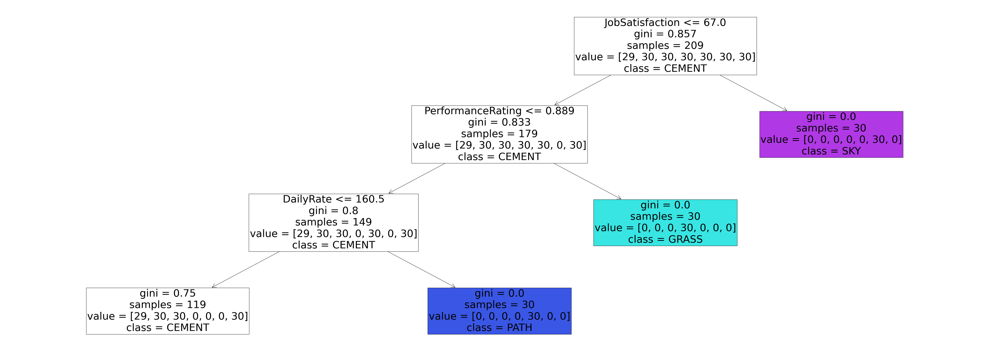

In [63]:
kfold=StratifiedKFold(n_splits=5,shuffle=True,random_state=2023)

dtc= DecisionTreeClassifier(random_state=2023)

params={'max_depth':[None,3,4,5],
       'min_samples_split':[2,5,10],    #dont make mistake in sample and samples correct : samples
       'min_samples_leaf':[1,4,10]}

gcv=GridSearchCV(dtc,param_grid=params,scoring='neg_log_loss',cv=kfold)

gcv.fit(X,le_y)

print(gcv.best_params_)
print(gcv.best_score_)


best_model = gcv.best_estimator_
plt.figure(figsize=(70,25))
tree.plot_tree(best_model,feature_names=x.columns,class_names=label.classes_,filled=True,fontsize=40)

# here for multi class while plotting the tree we should use class_names=label.classes . 
# It is mandatory for mulitclass only . In binary we pass the catgories like 'Yes'/NO
# class_names=label.classes : this will show the class name in the decision tree

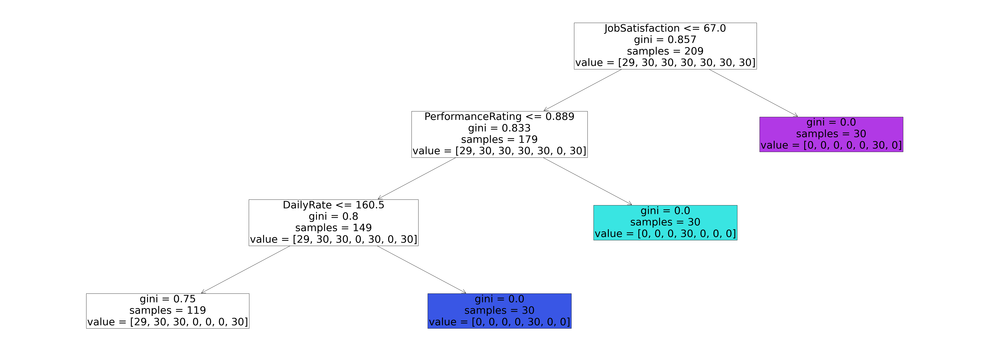

### Vehicle Dataset with Kfold , gridsearch

In [65]:
car = pd.read_csv("Vehicle.csv")
car.head()


,Comp,Circ,D.Circ,Rad.Ra,Pr.Axis.Ra,Max.L.Ra,Scat.Ra,Elong,Pr.Axis.Rect,Max.L.Rect,Sc.Var.Maxis,Sc.Var.maxis,Ra.Gyr,Skew.Maxis,Skew.maxis,Kurt.maxis,Kurt.Maxis,Holl.Ra,Class
0,95,48,83,178,72,10,162,42,20,159,176,379,184,70,6,16,187,197,van
1,91,41,84,141,57,9,149,45,19,143,170,330,158,72,9,14,189,199,van
2,104,50,106,209,66,10,207,32,23,158,223,635,220,73,14,9,188,196,saab
3,93,41,82,159,63,9,144,46,19,143,160,309,127,63,6,10,199,207,van
4,85,44,70,205,103,52,149,45,19,144,241,325,188,127,9,11,180,183,bus


In [66]:
X = car.drop('Class', axis=1)
y = car['Class']
X

,Comp,Circ,D.Circ,Rad.Ra,Pr.Axis.Ra,Max.L.Ra,Scat.Ra,Elong,Pr.Axis.Rect,Max.L.Rect,Sc.Var.Maxis,Sc.Var.maxis,Ra.Gyr,Skew.Maxis,Skew.maxis,Kurt.maxis,Kurt.Maxis,Holl.Ra
0,95,48,83,178,72,10,162,42,20,159,176,379,184,70,6,16,187,197
1,91,41,84,141,57,9,149,45,19,143,170,330,158,72,9,14,189,199
2,104,50,106,209,66,10,207,32,23,158,223,635,220,73,14,9,188,196
3,93,41,82,159,63,9,144,46,19,143,160,309,127,63,6,10,199,207
4,85,44,70,205,103,52,149,45,19,144,241,325,188,127,9,11,180,183
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
841,93,39,87,183,64,8,169,40,20,134,200,422,149,72,7,25,188,195
842,89,46,84,163,66,11,159,43,20,159,173,368,176,72,1,20,186,197
843,106,54,101,222,67,12,222,30,25,173,228,721,200,70,3,4,187,201
844,86,36,78,146,58,7,135,50,18,124,155,270,148,66,0,25,190,195


In [67]:
label=LabelEncoder()
le_y=label.fit_transform(y)
le_y

array([3, 3, 2, 3, 0, 0, 0, 3, 3, 2, 3, 2, 0, 3, 0, 1, 3, 0, 2, 1, 0, 3,
       0, 0, 2, 3, 2, 2, 0, 2, 3, 2, 1, 1, 1, 3, 0, 3, 2, 0, 1, 3, 3, 2,
       2, 3, 3, 0, 3, 2, 2, 2, 1, 0, 0, 3, 2, 3, 1, 3, 1, 1, 3, 0, 0, 1,
       0, 1, 3, 0, 1, 1, 1, 1, 3, 1, 2, 2, 0, 0, 0, 0, 3, 1, 0, 0, 3, 3,
       0, 1, 2, 1, 2, 3, 0, 1, 2, 0, 1, 0, 0, 3, 3, 3, 0, 2, 1, 1, 0, 0,
       3, 3, 1, 1, 3, 3, 1, 2, 0, 0, 2, 3, 3, 2, 3, 3, 0, 0, 3, 0, 2, 2,
       2, 3, 1, 3, 3, 3, 2, 3, 2, 0, 1, 0, 1, 1, 3, 0, 2, 3, 2, 0, 1, 2,
       3, 0, 1, 3, 2, 1, 1, 1, 2, 2, 1, 1, 2, 2, 0, 3, 1, 0, 3, 0, 3, 0,
       1, 0, 0, 3, 2, 1, 0, 2, 2, 0, 0, 1, 1, 1, 1, 3, 2, 0, 2, 0, 2, 0,
       0, 0, 3, 2, 1, 1, 3, 3, 1, 0, 0, 1, 1, 3, 0, 0, 1, 1, 2, 1, 0, 3,
       1, 3, 0, 0, 2, 3, 2, 3, 2, 2, 3, 2, 0, 2, 3, 3, 0, 0, 1, 0, 1, 1,
       0, 2, 3, 3, 0, 2, 1, 2, 3, 1, 3, 0, 3, 2, 2, 1, 2, 1, 2, 2, 3, 3,
       2, 0, 0, 2, 3, 3, 0, 2, 3, 3, 0, 0, 0, 1, 2, 0, 1, 0, 0, 2, 3, 2,
       0, 3, 1, 2, 3, 3, 0, 3, 0, 0, 0, 2, 2, 0, 2,

{'max_depth': 3, 'min_samples_leaf': 11, 'min_samples_split': 2}
-1.0305674768240356


[Text(0.5, 0.875, 'HourlyRate <= 41.5\ngini = 0.75\nsamples = 846\nvalue = [218, 212, 217, 199]\nclass = bus'),
 Text(0.25, 0.625, 'EmployeeNumber <= 7.5\ngini = 0.65\nsamples = 382\nvalue = [87, 147, 148, 0]\nclass = saab'),
 Text(0.125, 0.375, 'Age <= 95.5\ngini = 0.334\nsamples = 107\nvalue = [86, 9, 12, 0]\nclass = bus'),
 Text(0.0625, 0.125, 'gini = 0.641\nsamples = 37\nvalue = [17, 9, 11, 0]\nclass = bus'),
 Text(0.1875, 0.125, 'gini = 0.028\nsamples = 70\nvalue = [69, 0, 1, 0]\nclass = bus'),
 Text(0.375, 0.375, 'Age <= 106.5\ngini = 0.504\nsamples = 275\nvalue = [1, 138, 136, 0]\nclass = opel'),
 Text(0.3125, 0.125, 'gini = 0.488\nsamples = 220\nvalue = [0, 127, 93, 0]\nclass = opel'),
 Text(0.4375, 0.125, 'gini = 0.348\nsamples = 55\nvalue = [1, 11, 43, 0]\nclass = saab'),
 Text(0.75, 0.625, 'EmployeeNumber <= 8.5\ngini = 0.695\nsamples = 464\nvalue = [131, 65, 69, 199]\nclass = van'),
 Text(0.625, 0.375, 'MonthlyIncome <= 308.5\ngini = 0.729\nsamples = 348\nvalue = [126, 63, 

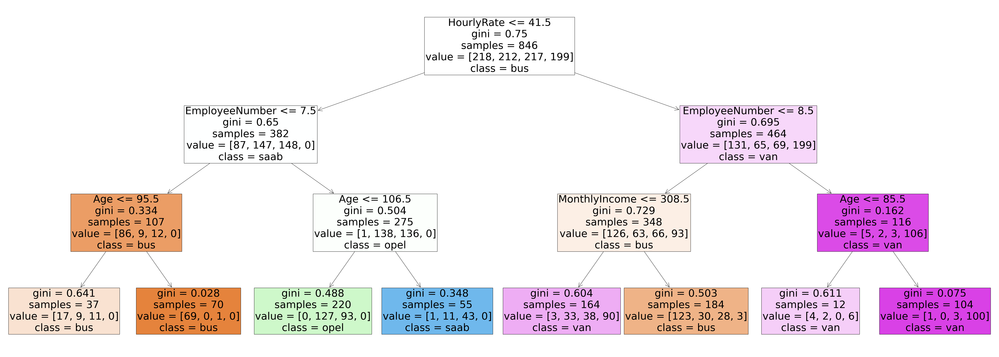

In [72]:
kfold=StratifiedKFold(n_splits=5,shuffle=True,random_state=2023)

dtc= DecisionTreeClassifier(random_state=2023)

params={'max_depth':[None,3,4,5],
       'min_samples_split':[2,4,6,8,10],    #dont make mistake in sample and samples correct : samples
       'min_samples_leaf':[1,3,5,9,11]}

gcv=GridSearchCV(dtc,param_grid=params,scoring='neg_log_loss',cv=kfold)

gcv.fit(X,le_y)

print(gcv.best_params_)
print(gcv.best_score_)

# best estimator having best combination of max_depth  in_samples_leaf': 11, 'min_samples_split': 2
best_model = gcv.best_estimator_

plt.figure(figsize=(70,25))
tree.plot_tree(best_model,feature_names=x.columns,class_names=label.classes_,filled=True,fontsize=40)

# neg_log_loss is used for mulitclass in gcv .In gcv we cannot use log_loss 
# for binary we use roc_auc and for multiclass we use "log_loss" and in gcv we use "neg_log_loss"
# here for multi class while plotting the tree we should use class_names=label.classes . 
# It is mandatory for mulitclass only . In binary we pass the catgories like 'Yes'/NO
# class_names=label.classes : this will show the class name in the decision tree

#### Feature importacne of any variable : What is feature importance in decision tree? Feature importance is calculated as the decrease in node impurity weighted by the probability of reaching that node. The node probability can be calculated by the number of samples that reach the node, divided by the total number of samples.

#### In short it denotes  which feature more flactuating with respect to responce variable(Y)

In [75]:
print(best_model.feature_importances_)
print(X.columns)  

[0.09356958 0.         0.         0.         0.         0.45018991
 0.         0.23126771 0.         0.         0.         0.22497281
 0.         0.         0.         0.         0.         0.        ]
Index(['Comp', 'Circ', 'D.Circ', 'Rad.Ra', 'Pr.Axis.Ra', 'Max.L.Ra', 'Scat.Ra',
       'Elong', 'Pr.Axis.Rect', 'Max.L.Rect', 'Sc.Var.Maxis', 'Sc.Var.maxis',
       'Ra.Gyr', 'Skew.Maxis', 'Skew.maxis', 'Kurt.maxis', 'Kurt.Maxis',
       'Holl.Ra'],
      dtype='object')


[0.09356958 0.         0.         0.         0.         0.45018991
 0.         0.23126771 0.         0.         0.         0.22497281
 0.         0.         0.         0.         0.         0.        ]
Index(['Comp', 'Circ', 'D.Circ', 'Rad.Ra', 'Pr.Axis.Ra', 'Max.L.Ra', 'Scat.Ra',
       'Elong', 'Pr.Axis.Rect', 'Max.L.Rect', 'Sc.Var.Maxis', 'Sc.Var.maxis',
       'Ra.Gyr', 'Skew.Maxis', 'Skew.maxis', 'Kurt.maxis', 'Kurt.Maxis',
       'Holl.Ra'],
      dtype='object')


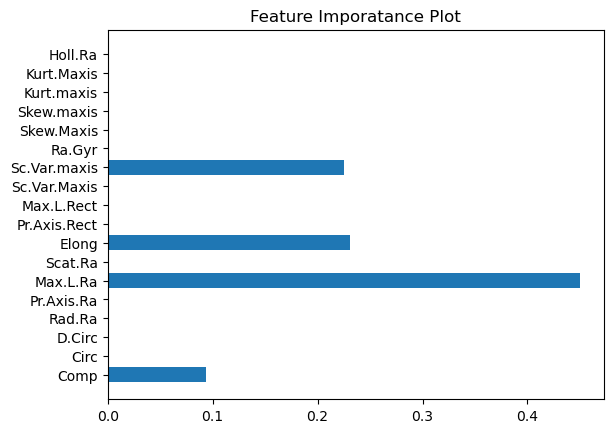

In [76]:
# we are findinh the feature inportance here
print(best_model.feature_importances_)
print(X.columns)
imps =best_model.feature_importances_
cols=X.columns
plt.barh(cols,imps)
plt.title("Feature Imporatance Plot")
plt.show()

### Finding Best feature for IBM Dataset

In [82]:
ibm=pd.read_csv('WA_Fn-UseC_-HR-Employee-Attrition.csv')

In [78]:
ibm

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,...,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,...,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,...,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,...,4,80,0,17,3,2,9,6,0,8


In [79]:
x = dum_ibm.drop('Attrition_Yes',axis =1)
y = dum_ibm['Attrition_Yes']

{'max_depth': 3, 'min_samples_leaf': 1, 'min_samples_split': 2}
-0.3878553698177959


[Text(0.5, 0.875, 'OverTime_Yes <= 0.5\ngini = 0.27\nsamples = 1470\nvalue = [1233, 237]\nclass = bus'),
 Text(0.25, 0.625, 'TotalWorkingYears <= 2.5\ngini = 0.187\nsamples = 1054\nvalue = [944, 110]\nclass = bus'),
 Text(0.125, 0.375, 'JobRole_Research Scientist <= 0.5\ngini = 0.442\nsamples = 88\nvalue = [59, 29]\nclass = bus'),
 Text(0.0625, 0.125, 'gini = 0.495\nsamples = 60\nvalue = [33, 27]\nclass = bus'),
 Text(0.1875, 0.125, 'gini = 0.133\nsamples = 28\nvalue = [26, 2]\nclass = bus'),
 Text(0.375, 0.375, 'WorkLifeBalance <= 1.5\ngini = 0.154\nsamples = 966\nvalue = [885, 81]\nclass = bus'),
 Text(0.3125, 0.125, 'gini = 0.37\nsamples = 53\nvalue = [40, 13]\nclass = bus'),
 Text(0.4375, 0.125, 'gini = 0.138\nsamples = 913\nvalue = [845, 68]\nclass = bus'),
 Text(0.75, 0.625, 'MonthlyIncome <= 2475.0\ngini = 0.424\nsamples = 416\nvalue = [289, 127]\nclass = bus'),
 Text(0.625, 0.375, 'DailyRate <= 931.0\ngini = 0.423\nsamples = 69\nvalue = [21, 48]\nclass = opel'),
 Text(0.5625, 0

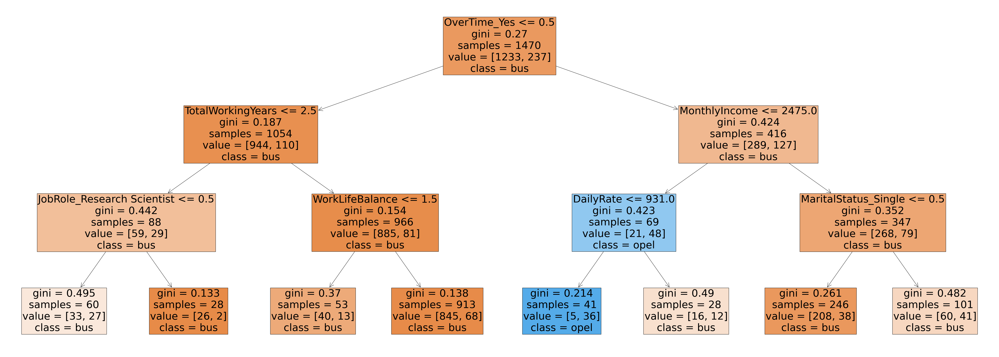

In [84]:
kfold=StratifiedKFold(n_splits=5,shuffle=True,random_state=2023)

dtc= DecisionTreeClassifier(random_state=2023)

params={'max_depth':[None,3,4,5],
       'min_samples_split':[2,4,6,8,10],    #dont make mistake in sample and samples correct : samples
       'min_samples_leaf':[1,3,5,9,11]}

gcv=GridSearchCV(dtc,param_grid=params,scoring='neg_log_loss',cv=kfold)

gcv.fit(x,y)

print(gcv.best_params_)
print(gcv.best_score_)


best_model = gcv.best_estimator_
plt.figure(figsize=(70,25))
tree.plot_tree(best_model,feature_names=x.columns,class_names=label.classes_,filled=True,fontsize=40)




- So best feature is **monthly income** for IBM dataset

## Best features for Bank Dataset

In [97]:
bank =  pd.read_csv("Bankruptcy.csv")
bank.tail()

,NO,D,YR,R1,R2,R3,R4,R5,R6,R7,...,R15,R16,R17,R18,R19,R20,R21,R22,R23,R24
127,128,1,77,0.27,0.03,0.07,0.10,0.09,0.18,0.26,...,0.11,0.06,0.12,0.17,7.56,2.07,1.45,0.06,0.13,0.19
128,129,1,77,0.32,0.03,0.03,0.09,0.05,0.06,0.16,...,0.17,0.07,0.09,0.26,5.99,1.27,2.74,0.06,0.08,0.21
129,130,1,78,0.08,0.01,0.02,0.05,0.04,0.07,0.15,...,0.19,0.07,0.12,0.26,7.14,1.89,2.10,0.07,0.12,0.26
130,131,1,78,0.14,0.01,0.05,0.07,0.02,0.09,0.14,...,0.07,0.02,0.10,0.15,170.96,4.55,1.45,0.02,0.10,0.14
131,132,1,78,0.26,0.07,0.12,0.17,0.00,0.01,0.01,...,0.05,0.04,0.07,0.10,5.44,1.84,1.40,0.05,0.08,0.12


In [98]:
X=bank.drop(['NO','D','YR'], axis=1)
y=bank['D']
X,y

(       R1    R2    R3    R4    R5    R6    R7     R8    R9   R10  ...   R15  \
 0    0.23  0.08  0.02  0.03  0.46  0.12  0.19  10.36  1.17  0.40  ...  0.05   
 1    0.19  0.07  0.09  0.12  0.02  0.02  0.03   3.13  1.73  0.60  ...  0.09   
 2    0.07  0.02  0.03  0.05  0.06  0.10  0.14   2.41  1.36  0.41  ... -0.03   
 3    0.07  0.03  0.04  0.04  0.04  0.06  0.06   5.55  1.13  0.44  ... -0.02   
 4    0.09  0.02  0.03  0.04  0.06  0.08  0.11   2.85  1.88  0.42  ...  0.02   
 ..    ...   ...   ...   ...   ...   ...   ...    ...   ...   ...  ...   ...   
 127  0.27  0.03  0.07  0.10  0.09  0.18  0.26   7.58  2.24  0.28  ...  0.11   
 128  0.32  0.03  0.03  0.09  0.05  0.06  0.16   3.24  5.44  0.46  ...  0.17   
 129  0.08  0.01  0.02  0.05  0.04  0.07  0.15   3.82  2.41  0.37  ...  0.19   
 130  0.14  0.01  0.05  0.07  0.02  0.09  0.14   8.18  1.57  0.11  ...  0.07   
 131  0.26  0.07  0.12  0.17  0.00  0.01  0.01   6.13  1.57  0.39  ...  0.05   
 
       R16   R17   R18     R19   R20  

Best_Parameters : {'max_depth': 4, 'min_samples_leaf': 5, 'min_samples_split': 2}
Best_score : 0.8274302620456465


[Text(0.4666666666666667, 0.9, 'R24 <= 0.095\ngini = 0.5\nsamples = 132\nvalue = [66, 66]\nclass = bus'),
 Text(0.26666666666666666, 0.7, 'R13 <= 0.035\ngini = 0.228\nsamples = 61\nvalue = [53, 8]\nclass = bus'),
 Text(0.2, 0.5, 'R3 <= 0.075\ngini = 0.137\nsamples = 54\nvalue = [50, 4]\nclass = bus'),
 Text(0.13333333333333333, 0.3, 'R21 <= 1.51\ngini = 0.043\nsamples = 46\nvalue = [45, 1]\nclass = bus'),
 Text(0.06666666666666667, 0.1, 'gini = 0.0\nsamples = 37\nvalue = [37, 0]\nclass = bus'),
 Text(0.2, 0.1, 'gini = 0.198\nsamples = 9\nvalue = [8, 1]\nclass = bus'),
 Text(0.26666666666666666, 0.3, 'gini = 0.469\nsamples = 8\nvalue = [5, 3]\nclass = bus'),
 Text(0.3333333333333333, 0.5, 'gini = 0.49\nsamples = 7\nvalue = [3, 4]\nclass = opel'),
 Text(0.6666666666666666, 0.7, 'R21 <= 1.625\ngini = 0.299\nsamples = 71\nvalue = [13, 58]\nclass = opel'),
 Text(0.4666666666666667, 0.5, 'R19 <= 4.92\ngini = 0.5\nsamples = 22\nvalue = [11, 11]\nclass = bus'),
 Text(0.4, 0.3, 'gini = 0.198\ns

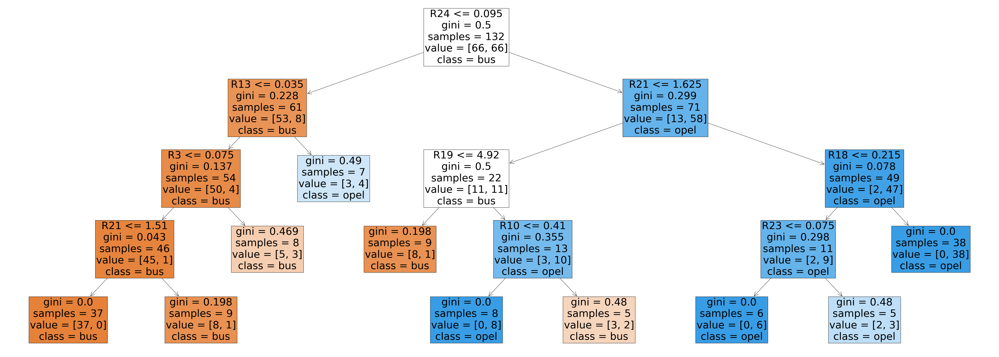

In [109]:
kfold=StratifiedKFold(n_splits=5,shuffle=True,random_state=2023)

dtc= DecisionTreeClassifier(random_state=2023)

params={'max_depth':[None,3,4,5],
       'min_samples_split':[2,4,6,8,10],    #dont make mistake in sample and samples correct : samples
       'min_samples_leaf':[1,3,5,9,11]}

gcv=GridSearchCV(dtc,param_grid=params,scoring='roc_auc',cv=kfold)

gcv.fit(X,y)

print("Best_Parameters :",gcv.best_params_)
print('Best_score :',gcv.best_score_)


best_model = gcv.best_estimator_
plt.figure(figsize=(70,25))
tree.plot_tree(best_model,feature_names=X.columns,class_names=label.classes_,filled=True,fontsize=40)



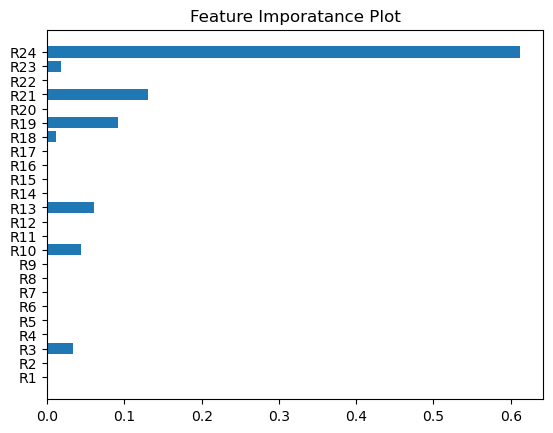

<Figure size 10000x2500 with 0 Axes>

In [103]:
## Best feature
imps =best_model.feature_importances_
cols=X.columns
plt.barh(cols,imps)
plt.title("Feature Imporatance Plot")
plt.figure(figsize=(100,25))
plt.show()

## DECISION TREE FOR REGRESSION(Response varaible is Numerical)

In [110]:
housing=pd.read_csv('Housing.csv')

In [111]:
housing

,price,lotsize,bedrooms,bathrms,stories,driveway,recroom,fullbase,gashw,airco,garagepl,prefarea
0,42000.0,5850,3,1,2,yes,no,yes,no,no,1,no
1,38500.0,4000,2,1,1,yes,no,no,no,no,0,no
2,49500.0,3060,3,1,1,yes,no,no,no,no,0,no
3,60500.0,6650,3,1,2,yes,yes,no,no,no,0,no
4,61000.0,6360,2,1,1,yes,no,no,no,no,0,no
...,...,...,...,...,...,...,...,...,...,...,...,...
541,91500.0,4800,3,2,4,yes,yes,no,no,yes,0,no
542,94000.0,6000,3,2,4,yes,no,no,no,yes,0,no
543,103000.0,6000,3,2,4,yes,yes,no,no,yes,1,no
544,105000.0,6000,3,2,2,yes,yes,no,no,yes,1,no


In [124]:
dum_hou=pd.get_dummies(housing,drop_first=True)
dum_hou

,price,lotsize,bedrooms,bathrms,stories,garagepl,driveway_yes,recroom_yes,fullbase_yes,gashw_yes,airco_yes,prefarea_yes
0,42000.0,5850,3,1,2,1,1,0,1,0,0,0
1,38500.0,4000,2,1,1,0,1,0,0,0,0,0
2,49500.0,3060,3,1,1,0,1,0,0,0,0,0
3,60500.0,6650,3,1,2,0,1,1,0,0,0,0
4,61000.0,6360,2,1,1,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
541,91500.0,4800,3,2,4,0,1,1,0,0,1,0
542,94000.0,6000,3,2,4,0,1,0,0,0,1,0
543,103000.0,6000,3,2,4,1,1,1,0,0,1,0
544,105000.0,6000,3,2,2,1,1,1,0,0,1,0


In [126]:
x = dum_hou.drop('price',axis =1)
y = dum_hou['price']

In [127]:
y

0       42000.0
1       38500.0
2       49500.0
3       60500.0
4       61000.0
         ...   
541     91500.0
542     94000.0
543    103000.0
544    105000.0
545    105000.0
Name: price, Length: 546, dtype: float64

In [129]:
X_train,X_test,y_train,y_test = train_test_split(x,y,random_state=2023,test_size=0.3)


[ 47200.52884615  61457.05128205  68819.56521739  98525.37777778
  61457.05128205  47200.52884615  68819.56521739  47200.52884615
  68819.56521739  47200.52884615  57301.06382979  88622.72727273
  68819.56521739  47200.52884615  57301.06382979  98525.37777778
  47200.52884615  47200.52884615  68819.56521739  61457.05128205
  76800.          57301.06382979  61457.05128205  98525.37777778
  57301.06382979  98525.37777778  61457.05128205  68819.56521739
  61457.05128205  47200.52884615  57301.06382979  57301.06382979
  61457.05128205  98525.37777778  47200.52884615  61457.05128205
  98525.37777778  98525.37777778  61457.05128205  61457.05128205
  98525.37777778  47200.52884615  47200.52884615  68819.56521739
  76800.          47200.52884615  98525.37777778  76800.
  47200.52884615  61457.05128205  47200.52884615  47200.52884615
  88622.72727273  88622.72727273  61457.05128205  88622.72727273
  61457.05128205  61457.05128205  47200.52884615  61457.05128205
  98525.37777778 143825.         

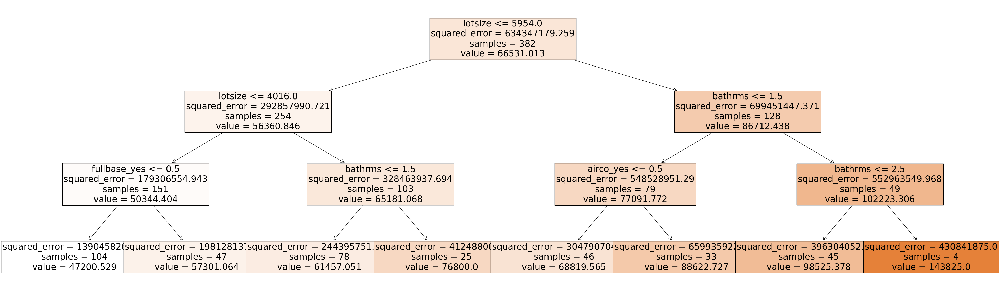

In [139]:
## Without using gridsearch
dtr = DecisionTreeRegressor(random_state=2023,max_depth=3)
# FOR REGRESSION USE USE DecisionTreeRegressor
dtr.fit(X_train,y_train)

plt.figure(figsize=(50,15))
tree.plot_tree(dtc,feature_names=X_train.columns,filled=True, fontsize=25)
# FOR REGRESSION COL NAMES NOT INCLUDE
y_pred=dtr.predict(X_test)
print(y_pred)
# predicting the price


### Using Grid Search 

Best_Parameters : {'max_depth': 9, 'min_samples_leaf': 11, 'min_samples_split': 2}
Best_score : 0.4913960895042041


[Text(0.6284722222222222, 0.95, 'lotsize <= 5954.0\nsquared_error = 711726713.995\nsamples = 546\nvalue = 68121.597'),
 Text(0.41898148148148145, 0.85, 'bathrms <= 1.5\nsquared_error = 343663992.374\nsamples = 362\nvalue = 57638.812'),
 Text(0.2824074074074074, 0.75, 'lotsize <= 4016.0\nsquared_error = 231558730.612\nsamples = 294\nvalue = 54003.571'),
 Text(0.14814814814814814, 0.65, 'stories <= 1.5\nsquared_error = 168557540.732\nsamples = 174\nvalue = 49017.529'),
 Text(0.07407407407407407, 0.55, 'lotsize <= 3405.0\nsquared_error = 129443331.484\nsamples = 80\nvalue = 44539.375'),
 Text(0.037037037037037035, 0.45, 'driveway_yes <= 0.5\nsquared_error = 72274933.997\nsamples = 34\nvalue = 39302.941'),
 Text(0.018518518518518517, 0.35, 'squared_error = 47446423.529\nsamples = 17\nvalue = 36285.0'),
 Text(0.05555555555555555, 0.35, 'squared_error = 78887506.574\nsamples = 17\nvalue = 42320.882'),
 Text(0.1111111111111111, 0.45, 'bedrooms <= 2.5\nsquared_error = 136451045.605\nsamples = 

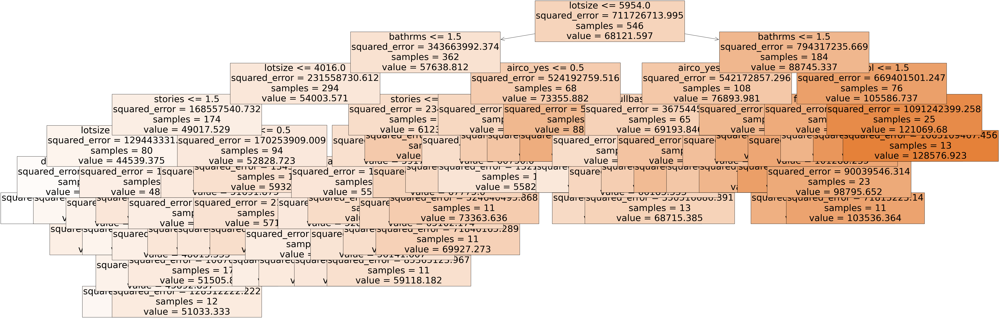

In [149]:
kfold=KFold(n_splits=5,shuffle=True,random_state=2023)
## for regression(Numerical) we use kfold We cannot use StratifiedKFold . StratifiedKFold Is for Classification 
dtr= DecisionTreeRegressor(random_state=2023)

params={'max_depth':np.arange(1,11),
       'min_samples_split':[2,4,6,8,10],    #dont make mistake in sample and samples correct : samples
       'min_samples_leaf':[1,3,5,9,11]}

gcv=GridSearchCV(dtr,param_grid=params,scoring='r2',cv=kfold)

gcv.fit(x,y)

print("Best_Parameters :",gcv.best_params_)
print('Best_score :',gcv.best_score_)
best_model = gcv.best_estimator_
plt.figure(figsize=(70,25))
tree.plot_tree(best_model,feature_names=x.columns,filled=True,fontsize=40)




[0.54392805 0.00869962 0.22805642 0.03203889 0.05053398 0.00123018
 0.01296151 0.04201411 0.         0.07872199 0.00181523]
Index(['lotsize', 'bedrooms', 'bathrms', 'stories', 'garagepl', 'driveway_yes',
       'recroom_yes', 'fullbase_yes', 'gashw_yes', 'airco_yes',
       'prefarea_yes'],
      dtype='object')


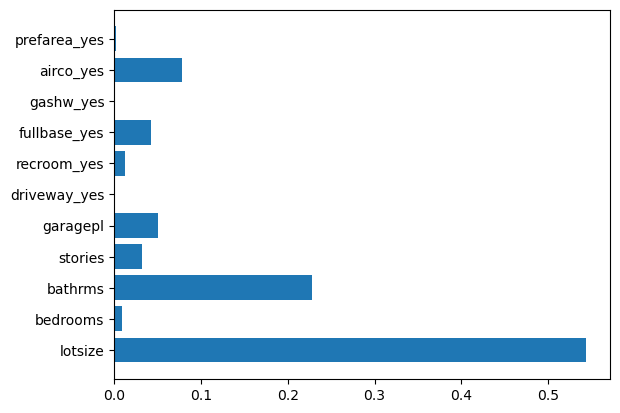

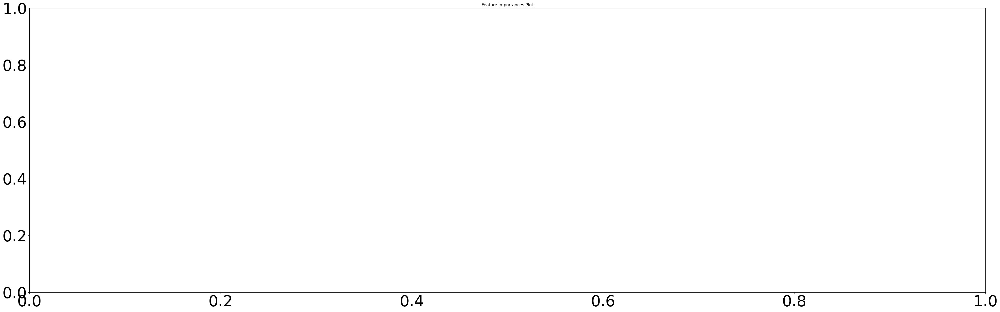

In [150]:
#### Feature Importances
print(best_model.feature_importances_)
print(x.columns)
imps=best_model.feature_importances_
cols=x.columns
plt.barh(cols, imps)
plt.figure(figsize=(50,15))
plt.tick_params(labelsize=45)
plt.title("Feature Importances Plot")
plt.show()


In [ ]:

# kfold=KFold(n_splits=5,shuffle=True,random_state=2023)
# dtc=DecisionTreeRegressor(random_state=2023)
# params={'max_depth':[None,3,4,5],
#         'min_samples_split':[2,4,6,8,10],
#         'min_samples_leaf':[1,3,5,9,11]}
# gcv= GridSearchCV(dtc, param_grid=params,cv=kfold,scoring='r2')
# gcv.fit(X,y)
# print(gcv.best_params_)
# print(gcv.best_score_)

# ## View the  tree
# best_model=gcv.best_estimator_

# tree.plot_tree(best_model,feature_names=X.columns,
#                filled=True,fontsize=22)

# #### Feature Importances
# print(best_model.feature_importances_)
# print(X.columns)
# imps=best_model.feature_importances_
# cols=X.columns
# plt.barh(cols, imps)
# plt.figure(figsize=(50,15))
# plt.tick_params(labelsize=45)
# plt.title("Feature Importances Plot")
# plt.show()

## Regression :Concrete Dataset

In [152]:
con=pd.read_csv("Concrete_Data.csv")
con

,Cement,Blast,Fly,Water,Superplasticizer,Coarse,Fine,Age,Strength
0,540.0,0.0,0.0,162.0,2.5,1040.0,676.0,28,79.99
1,540.0,0.0,0.0,162.0,2.5,1055.0,676.0,28,61.89
2,332.5,142.5,0.0,228.0,0.0,932.0,594.0,270,40.27
3,332.5,142.5,0.0,228.0,0.0,932.0,594.0,365,41.05
4,198.6,132.4,0.0,192.0,0.0,978.4,825.5,360,44.30
...,...,...,...,...,...,...,...,...,...
1025,276.4,116.0,90.3,179.6,8.9,870.1,768.3,28,44.28
1026,322.2,0.0,115.6,196.0,10.4,817.9,813.4,28,31.18
1027,148.5,139.4,108.6,192.7,6.1,892.4,780.0,28,23.70
1028,159.1,186.7,0.0,175.6,11.3,989.6,788.9,28,32.77


In [155]:
x= con.drop('Strength', axis=1)
y = con['Strength']
y

0       79.99
1       61.89
2       40.27
3       41.05
4       44.30
        ...  
1025    44.28
1026    31.18
1027    23.70
1028    32.77
1029    32.40
Name: Strength, Length: 1030, dtype: float64

Best_Parameters : {'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 8}
Best_score : 0.8248626109856485


[Text(0.4662528538812785, 0.9545454545454546, 'Age <= 21.0\nsquared_error = 278.811\nsamples = 1030\nvalue = 35.818'),
 Text(0.1989868721461187, 0.8636363636363636, 'Cement <= 354.5\nsquared_error = 153.562\nsamples = 324\nvalue = 23.541'),
 Text(0.12057648401826485, 0.7727272727272727, 'Age <= 10.5\nsquared_error = 79.945\nsamples = 230\nvalue = 18.706'),
 Text(0.07220319634703197, 0.6818181818181818, 'Cement <= 255.25\nsquared_error = 52.389\nsamples = 173\nvalue = 15.714'),
 Text(0.03424657534246575, 0.5909090909090909, 'Cement <= 155.0\nsquared_error = 26.88\nsamples = 111\nvalue = 13.076'),
 Text(0.0182648401826484, 0.5, 'Age <= 5.0\nsquared_error = 10.637\nsamples = 17\nvalue = 7.73'),
 Text(0.0091324200913242, 0.4090909090909091, 'Water <= 197.75\nsquared_error = 3.077\nsamples = 8\nvalue = 5.131'),
 Text(0.0045662100456621, 0.3181818181818182, 'squared_error = 1.713\nsamples = 5\nvalue = 6.114'),
 Text(0.0136986301369863, 0.3181818181818182, 'squared_error = 1.057\nsamples = 3\

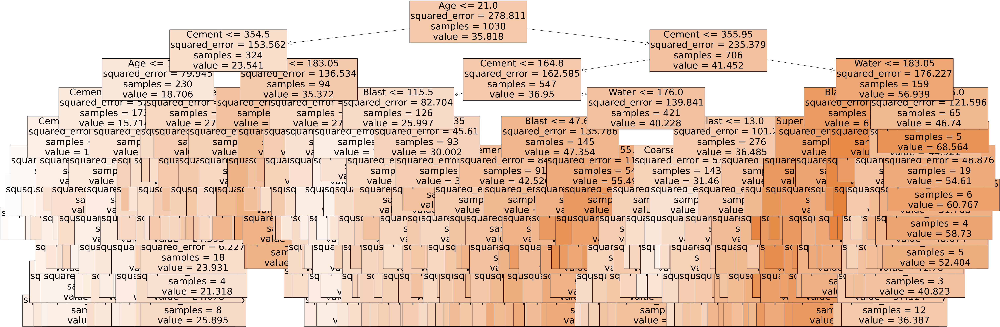

In [156]:
kfold=KFold(n_splits=5,shuffle=True,random_state=2023)
## for regression(Numerical) we use kfold We cannot use StratifiedKFold . StratifiedKFold Is for Classification 
dtr= DecisionTreeRegressor(random_state=2023)

params={'max_depth':np.arange(1,11),
       'min_samples_split':[2,4,6,8,10],    #dont make mistake in sample and samples correct : samples
       'min_samples_leaf':[1,3,5,9,11]}

gcv=GridSearchCV(dtr,param_grid=params,scoring='r2',cv=kfold)

gcv.fit(x,y)

print("Best_Parameters :",gcv.best_params_)
print('Best_score :',gcv.best_score_)
best_model = gcv.best_estimator_
plt.figure(figsize=(70,25))
tree.plot_tree(best_model,feature_names=x.columns,filled=True,fontsize=40)



[0.37095725 0.11281242 0.00832587 0.11120721 0.02172944 0.02722687
 0.0208557  0.32688524]
Index(['Cement', 'Blast', 'Fly', 'Water', 'Superplasticizer', 'Coarse', 'Fine',
       'Age'],
      dtype='object')


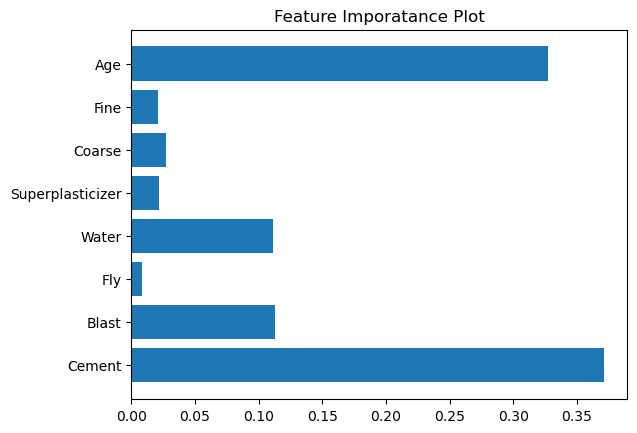

In [169]:
#### Feature Importances
print(best_model.feature_importances_)
print(x.columns)
imps =best_model.feature_importances_
cols=x.columns
plt.barh(cols,imps)
plt.title("Feature Imporatance Plot")
plt.show()

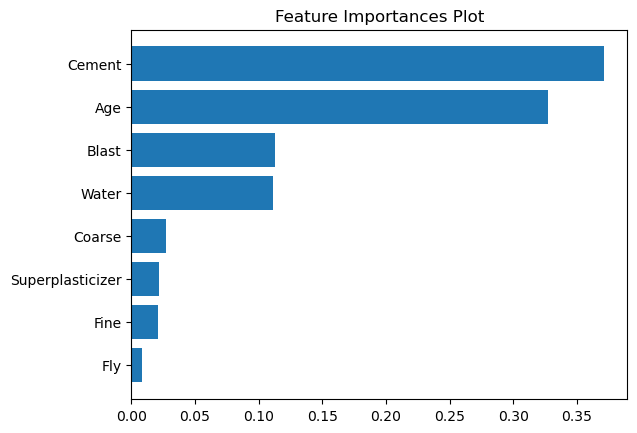

In [166]:
## To sort the same graph in descending
s_index=np.argsort(imps)
sorted_imps =imps[s_index]
sorted_x=cols[s_index]
plt.barh(sorted_x,sorted_imps)
plt.title("Feature Importances Plot")
plt.show()

## Insurance Dataset(Regression Problem)

In [170]:
ins=pd.read_csv('insurance.csv')
ins


,age,sex,bmi,children,smoker,region,charges
0,19,female,27.900,0,yes,southwest,16884.92400
1,18,male,33.770,1,no,southeast,1725.55230
2,28,male,33.000,3,no,southeast,4449.46200
3,33,male,22.705,0,no,northwest,21984.47061
4,32,male,28.880,0,no,northwest,3866.85520
...,...,...,...,...,...,...,...
1333,50,male,30.970,3,no,northwest,10600.54830
1334,18,female,31.920,0,no,northeast,2205.98080
1335,18,female,36.850,0,no,southeast,1629.83350
1336,21,female,25.800,0,no,southwest,2007.94500


In [172]:
dum_ins=pd.get_dummies(ins,drop_first=True)
dum_ins

,age,bmi,children,charges,sex_male,smoker_yes,region_northwest,region_southeast,region_southwest
0,19,27.900,0,16884.92400,0,1,0,0,1
1,18,33.770,1,1725.55230,1,0,0,1,0
2,28,33.000,3,4449.46200,1,0,0,1,0
3,33,22.705,0,21984.47061,1,0,1,0,0
4,32,28.880,0,3866.85520,1,0,1,0,0
...,...,...,...,...,...,...,...,...,...
1333,50,30.970,3,10600.54830,1,0,1,0,0
1334,18,31.920,0,2205.98080,0,0,0,0,0
1335,18,36.850,0,1629.83350,0,0,0,1,0
1336,21,25.800,0,2007.94500,0,0,0,0,1


In [174]:
x=dum_ins.drop('charges',axis=1)
y=dum_ins['charges']

Best_Parameters : {'max_depth': 5, 'min_samples_leaf': 10, 'min_samples_split': 2}
Best_score : 0.8573946912614747
Best_Instimator DecisionTreeRegressor(max_depth=5, min_samples_leaf=10, random_state=2023)


[Text(0.5, 0.9166666666666666, 'smoker_yes <= 0.5\nsquared_error = 146542766.494\nsamples = 1338\nvalue = 13270.422'),
 Text(0.25, 0.75, 'age <= 42.5\nsquared_error = 35891656.003\nsamples = 1064\nvalue = 8434.268'),
 Text(0.125, 0.5833333333333334, 'children <= 0.5\nsquared_error = 22145208.607\nsamples = 596\nvalue = 5398.85'),
 Text(0.0625, 0.4166666666666667, 'age <= 32.5\nsquared_error = 16936983.559\nsamples = 253\nvalue = 3850.841'),
 Text(0.03125, 0.25, 'age <= 22.5\nsquared_error = 15402722.978\nsamples = 207\nvalue = 3269.547'),
 Text(0.015625, 0.08333333333333333, 'squared_error = 11536916.879\nsamples = 121\nvalue = 2585.698'),
 Text(0.046875, 0.08333333333333333, 'squared_error = 19258096.923\nsamples = 86\nvalue = 4231.708'),
 Text(0.09375, 0.25, 'sex_male <= 0.5\nsquared_error = 15478063.204\nsamples = 46\nvalue = 6466.664'),
 Text(0.078125, 0.08333333333333333, 'squared_error = 453272.68\nsamples = 24\nvalue = 5487.082'),
 Text(0.109375, 0.08333333333333333, 'squared_er

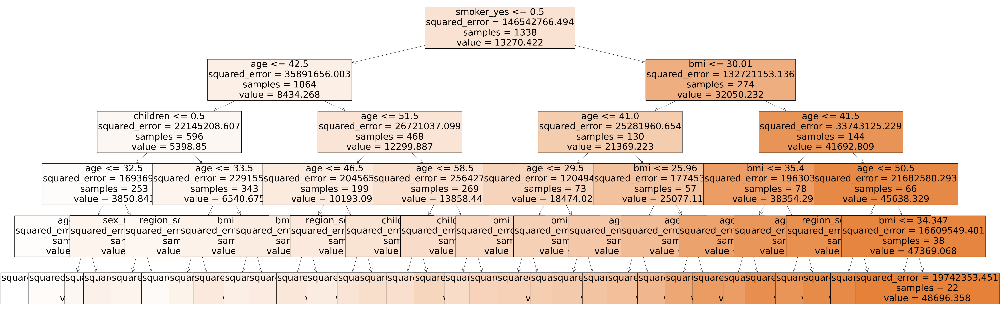

In [178]:
kfold=KFold(n_splits=5,shuffle=True,random_state=2023)
## for regression(Numerical) we use kfold We cannot use StratifiedKFold . StratifiedKFold Is for Classification 
dtr= DecisionTreeRegressor(random_state=2023)

params={'max_depth':[None,2,5],
       'min_samples_split':np.arange(2,11),    #dont make mistake in sample and samples correct : samples
       'min_samples_leaf':np.arange(2,11)}

gcv=GridSearchCV(dtr,param_grid=params,scoring='r2',cv=kfold)

gcv.fit(x,y)

print("Best_Parameters :",gcv.best_params_)
print('Best_score :',gcv.best_score_)
best_model = gcv.best_estimator_
plt.figure(figsize=(70,25))
tree.plot_tree(best_model,feature_names=x.columns,filled=True,fontsize=40)



[1.12378774e-01 1.69788403e-01 8.70106031e-03 2.80119932e-04
 7.06908936e-01 0.00000000e+00 9.01321629e-04 1.04138494e-03]
Index(['age', 'bmi', 'children', 'sex_male', 'smoker_yes', 'region_northwest',
       'region_southeast', 'region_southwest'],
      dtype='object')


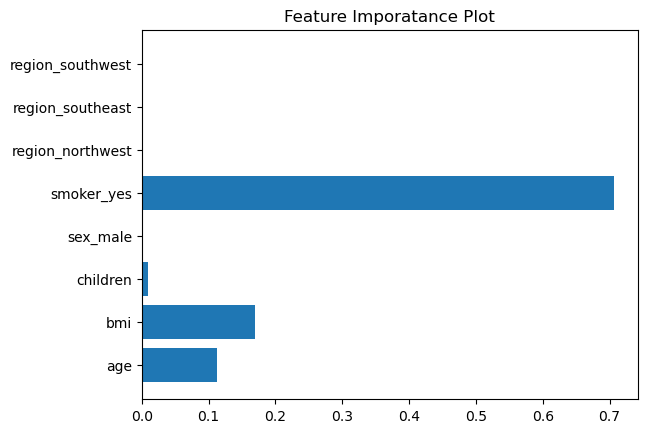

In [176]:
#### Feature Importances
print(best_model.feature_importances_)
print(x.columns)
imps =best_model.feature_importances_
cols=x.columns
plt.barh(cols,imps)
plt.title("Feature Imporatance Plot")
plt.show()

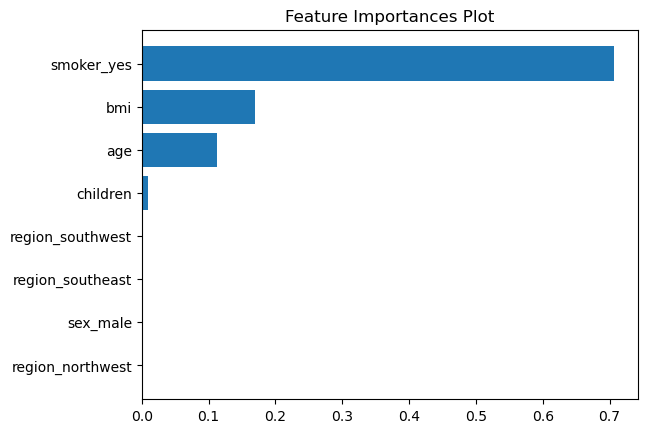

In [177]:
## To sort the same graph in descending
s_index=np.argsort(imps)
sorted_imps =imps[s_index]
sorted_x=cols[s_index]
plt.barh(sorted_x,sorted_imps)
plt.title("Feature Importances Plot")
plt.show()

In [180]:
train=pd.read_csv('train.csv')
train

,id,f0,f1,f2,f3,f4,f5,f6,f7,f8,...,f91,f92,f93,f94,f95,f96,f97,f98,f99,loss
0,0,-0.002350,59,0.766739,-1.350460,42.27270,16.68570,30.35990,1.267300,0.392007,...,-42.43990,26.854000,1.45751,0.696161,0.941764,1.828470,0.924090,2.296580,10.489800,15
1,1,0.784462,145,-0.463845,-0.530421,27324.90000,3.47545,160.49800,0.828007,3.735860,...,-184.13200,7.901370,1.70644,-0.494699,-2.058300,0.819184,0.439152,2.364700,1.143830,3
2,2,0.317816,19,-0.432571,-0.382644,1383.26000,19.71290,31.10260,-0.515354,34.430800,...,7.43721,37.218100,3.25339,0.337934,0.615037,2.216760,0.745268,1.696790,12.305500,6
3,3,0.210753,17,-0.616454,0.946362,-119.25300,4.08235,185.25700,1.383310,-47.521400,...,9.66778,0.626942,1.49425,0.517513,-10.222100,2.627310,0.617270,1.456450,10.028800,2
4,4,0.439671,20,0.968126,-0.092546,74.30200,12.30650,72.18600,-0.233964,24.399100,...,290.65700,15.604300,1.73557,-0.476668,1.390190,2.195740,0.826987,1.784850,7.071970,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
249995,249995,0.923980,6,0.663212,-0.055120,6.61768,1.26619,40.44790,0.852375,25.522400,...,3517.97000,18.534200,1.41936,0.607504,4.950780,2.853420,0.961882,1.068010,1.437650,11
249996,249996,0.243556,7,-0.557062,1.333470,-54.88610,17.58310,212.96400,-1.204750,-128.385000,...,1945.81000,19.482200,1.60072,-0.154877,5.693280,1.994540,0.760925,1.427880,1.226720,5
249997,249997,0.046023,53,0.462863,0.704034,2062.94000,14.58160,11.42710,-0.509812,80.818000,...,-28.46890,11.008200,1.61080,-0.350927,27.986900,1.012690,0.830533,1.005470,0.455332,1
249998,249998,0.977330,12,-1.002880,0.576377,4741.16000,11.10090,3.81546,0.616191,118.902000,...,-275.53700,21.985700,3.16051,0.772058,2.592220,3.938260,0.697430,0.962347,7.415890,10


In [182]:
x=train.drop(['loss','id'],axis=1)
y=train['loss']

In [183]:
kfold=KFold(n_splits=5,shuffle=True,random_state=2023)
## for regression(Numerical) we use kfold We cannot use StratifiedKFold . StratifiedKFold Is for Classification 
dtr= DecisionTreeRegressor(random_state=2023)

params={'max_depth':[None,2,5],
       'min_samples_split':np.arange(2,11),    #dont make mistake in sample and samples correct : samples
       'min_samples_leaf':np.arange(2,11)}

gcv=GridSearchCV(dtr,param_grid=params,scoring='r2',cv=kfold)

gcv.fit(x,y)

print("Best_Parameters :",gcv.best_params_)
print('Best_score :',gcv.best_score_)
best_model = gcv.best_estimator_
plt.figure(figsize=(70,25))
tree.plot_tree(best_model,feature_names=x.columns,filled=True,fontsize=40)



KeyboardInterrupt: 

In [ ]:
#### Feature Importances
print(best_model.feature_importances_)
print(x.columns)
imps =best_model.feature_importances_
cols=x.columns
plt.barh(cols,imps)
plt.title("Feature Imporatance Plot")
plt.show()

In [ ]:
## To sort the same graph in descending
s_index=np.argsort(imps)
sorted_imps =imps[s_index]
sorted_x=cols[s_index]
plt.barh(sorted_x,sorted_imps)
plt.title("Feature Importances Plot")
plt.show()

In [ ]:
# ELASTIC 

from sklearn.linear_model import Ridge, Lasso, ElasticNet
elastic = ElasticNet()
kfold=KFold(n_splits=5, random_state=2023, shuffle=True)
params = {'alpha':np.linspace(0,10,5), 'l1_ratio':np.linspace(0,1,5)}
gcv = GridSearchCV(elastic, param_grid = params, cv = kfold)
gcv.fit(x,y)
print(gcv.best_params_)
print(gcv.best_score_)

